<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/eas7_faces_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
%matplotlib inline
# import wget
import zipfile
import os

In [0]:
from google.colab import auth
auth.authenticate_user()

In [3]:
os.environ['KAGGLE_USERNAME']="skooch"
os.environ['KAGGLE_KEY']="c5356997e70d50a333ef244bd276e51d"

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}

Updated property [core/project].


In [4]:
!gsutil cp gs://{bucket_name}/model0.pt ./model.pt 

Copying gs://pneumonia/model0.pt...
\ [1 files][377.5 MiB/377.5 MiB]                                                
Operation completed over 1 objects/377.5 MiB.                                    


In [5]:
if not os.path.exists("celeba-dataset.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
  zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()

  zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

Copying gs://pneumonia/celeba-dataset.zip...
| [1 files][  1.2 GiB/  1.2 GiB]  106.0 MiB/s                                   
Operation completed over 1 objects/1.2 GiB.                                      


In [6]:
if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()
  
# if not os.path.exists("GWB_200x200_JPEG.zip"):
#   !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
#   zip_ref = zipfile.ZipFile('GWB_200x200_JPEG.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()  

--2019-05-07 05:10:44--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.154.45
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.154.45|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1073596 (1.0M) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>]   1.02M  --.-KB/s    in 0.08s   

2019-05-07 05:10:44 (12.1 MB/s) - ‘Training_Pictures.zip’ saved [1073596/1073596]



In [7]:
if not os.path.exists("wiki_images2.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images2.zip ./wiki_images.zip
  zip_ref = zipfile.ZipFile('wiki_images.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()
  
if not os.path.exists("imdb_images3.zip"):
  !gsutil cp gs://{bucket_name}/imdb_images3.zip ./imdb_images3.zip
  zip_ref = zipfile.ZipFile('imdb_images3.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()    

Copying gs://pneumonia/wiki_images2.zip...
\ [1 files][160.5 MiB/160.5 MiB]                                                
Operation completed over 1 objects/160.5 MiB.                                    
Copying gs://pneumonia/imdb_images3.zip...
\ [1 files][  1.5 GiB/  1.5 GiB]   99.4 MiB/s                                   
Operation completed over 1 objects/1.5 GiB.                                      


In [0]:
BATCH_SIZE = 48
data_path = "data/images"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=5, translate=(0.05,0.05), scale=(0.9,1.1), shear=2, resample=False, fillcolor=0),        
      ], 0.4),
      torchvision.transforms.RandomResizedCrop((192,160), scale=(0.90, 1.1)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=2,
    shuffle=True
)

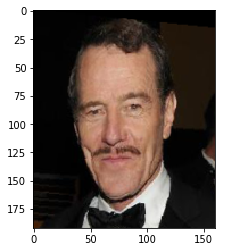

In [9]:
for (images, _) in train_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

In [27]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 393640
    Root Location: data/images
    Transforms (if any): Compose(
                             RandomHorizontalFlip(p=0.5)
                             RandomApply(
                             p=0.4
                             RandomAffine(degrees=(-5, 5), translate=(0.05, 0.05), scale=(0.9, 1.1), shear=(-2, 2))
                         )
                             RandomResizedCrop(size=(192, 160), scale=(0.9, 1.1), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
                             ToTensor()
                         )
    Target Transforms (if any): None

In [0]:
def output_size(i, k=3, p=2, s=1, d=1):
    o = (i + 2*p - k - (k-1)*(d-1))/s + 1
    return o
  
output_size(i=64, k=3, p=1)

### Development Model

In [0]:
from torch import nn
class Encoder(nn.Module):
    def __init__(self, latent_dim, variational=False):
        super(Encoder, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
#         self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 32, 3, padding=1)
        
        # block 2
        self.conv4 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv5 = nn.Conv2d(64, 64, 3, padding=1)
        
        # block 3
        self.conv6 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv7 = nn.Conv2d(128, 128, 3, padding=1)
        
        # block 4
        self.conv8 = nn.Conv2d(128, 256, 3, padding=1)
        
        self.fc1 = nn.Linear(4096, latent_dim) # code layer
#         self.fc2 = nn.Linear(4096, latent_dim) # logvar layer

        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.variational = variational
        
    def encode(self, x):
        # input 64x64x3 - output 32x32x32
        h1 = self.relu(self.conv1(x))
#         h2 = self.relu(self.conv2(h1))
        h3 = self.relu(self.conv3(h1))
        
        # input 32x32x16 - output 16x16x64
        mp1 = self.max_pool(h3)
        h4 = self.relu(self.conv4(mp1))
        h5 = self.max_pool(self.relu(self.conv5(h4)))
        
        # input 16x16x32 - output 8x8x128
        h6 = self.relu(self.conv6(h5))
        h7 = self.max_pool(self.relu(self.conv7(h6)))
        
        # input 8x8x128 - output 4x4x128
        h8 = self.max_pool(self.relu(self.conv8(h7)))
        
        #  input 4x4x128 - output 1x2048
        reshaped = h8.reshape((-1, 4096))
        
        # input 4x4x64 - output latent_dimx1
        code = self.fc1(reshaped)
        logvar = None
  
        return code, logvar
  
    def forward(self, x):
        code, logvar = self.encode(x)
        return code, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(latent_dim, 4096)
        self.deconv1 = nn.ConvTranspose2d(256, 224, 2, stride=2, output_padding=0)
        self.deconv3 = nn.ConvTranspose2d(224, 192, 2, stride=2)
        self.deconv4 = nn.ConvTranspose2d(192, 156, 2, stride=2)
        self.deconv5 = nn.ConvTranspose2d(156, 128, 2, stride=2)
        self.deconv6 = nn.Conv2d(128, 3, 1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
  
    def decode(self, x):
        # input latent_dimx1 - output 2048x1
        h0 = self.relu(self.fc1(x))
        # input 2048x1 - output 4x4x127
        reshaped = h0.reshape((-1,256,4,4))
        # in 4x4x127- out 8x8x64
        h1 = self.relu(self.deconv1(reshaped))
        # in 8x8x64 - out 16x16x32
        h3 = self.relu(self.deconv3(h1))
        h4 = self.relu(self.deconv4(h3))
        h5 = self.relu(self.deconv5(h4))
        h6 = self.deconv6(h5)
        
        return self.sigmoid(h6)
    
    def forward(self, x):
        return self.decode(x)
    
# a model that uses the Encoder and Decoder
class SingleModel(nn.Module):
    def __init__(self, encoder, decoder, variational=False):
        super(SingleModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.variational = variational

    def sample(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.autograd.Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)

    def forward(self, X):
        mu, logvar = encoder(X)

        if self.training and logvar is not None:
            z = self.sample(mu, logvar)
        else:
            z = mu
            
        recon = self.decoder(z)
        
        return recon, mu, logvar

### Bigger Model

In [0]:
epoch_list = []

In [0]:
def vae_loss(x, x_hat, mu=None, logvar=None):
    MSE = nn.functional.mse_loss(x, x_hat)
    
    if mu is not None and logvar is not None:
      KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
      KLD /= BATCH_SIZE * 784
      MSE = MSE + KLD
      
    return MSE
  
def train(model, train_loader, optimizer, print_metrics=1000, plot_images=4000, num_epochs=10, display_images=5, scheduler=None, save_path="model.pt"):
    model.train()
    try:
      for epoch in range(num_epochs):
          upload_path = save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          tr_loss = 0.0
          batch_losses = []
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              optimizer.zero_grad()

              recon, code, logvar = model(inputs)
              if model.variational:
                  loss = vae_loss(inputs, recon, code, logvar=logvar)
              else:  
                  loss = vae_loss(inputs, recon, code, logvar=None)

              loss.backward()
              optimizer.step()

              tr_loss += loss.item()
              batch_losses.append(loss.item())

              if i % 1000 == print_metrics and i > 0:
                print("\tEpoch", len(epoch_list), "batch", i, "loss:", loss.item())

              if i % 4000 == plot_images and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()

          print("Epoch:", len(epoch_list), "Loss:", tr_loss)
          
          epoch_list.append(epoch)
          
          if scheduler is not None and epoch % 5 == 0 and epoch > 1:
              scheduler.step()

          if epoch % display_images == 0:
              # plot a few random images
              try:
                  fig, ax = plt.subplots(1, 2, figsize=(6,6))
                  ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                  ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                  plt.show()
              except Exception as e:
                  print(e)

              torch.save(model.state_dict(), save_path)
#               !gsutil cp ./model.pt gs://{bucket_name}/
                
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(model.state_dict(), save_path)
      !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      return 
    
    !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
    
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params                

In [0]:
!gsutil cp model.pt gs://{bucket_name}/

Copying file://model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
from torch import nn
class Encoder(nn.Module):
    def __init__(self, latent_dim, variational=False):
        super(Encoder, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)        
        self.conv3 = nn.Conv2d(32, 32, 3, padding=1)
        
        # block 2
        self.conv4 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv5 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv6 = nn.Conv2d(64, 64, 3, padding=1)
        
        # block 3
        self.conv7 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv8 = nn.Conv2d(128, 128, 3, padding=1)
        self.conv9 = nn.Conv2d(128, 128, 3, padding=1)
        
        # block 4
        self.conv10 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv11 = nn.Conv2d(256, 256, 3, padding=1)
        
        # block 5
        self.conv12 = nn.Conv2d(256, 384, 3, padding=1)
        self.conv13 = nn.Conv2d(384, 384, 3, padding=1)
        
        self.fc1 = nn.Conv2d(384, latent_dim, (6,5)) # code layer

        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.variational = variational
        
    def encode(self, x):
        # input 178x178x3 - output 80x80x32
        h1 = self.relu(self.conv1(x))
        h2 = self.relu(self.conv2(h1))
        h3 = self.relu(self.conv3(h2))
        mp1 = self.max_pool(h3)
        
        # input 89x89x32 - output 64x40x40
        h4 = self.conv4(mp1)
        h5 = self.relu(self.conv5(self.relu(h4)))
        h6 = self.max_pool(self.relu(self.conv6(h5)) + h4)
        
        # input 54x44x64 - output 128x20x20
        h7 = self.conv7(h6)
        h8 = self.relu(self.conv8(self.relu(h7)))
        h9 = self.max_pool(self.relu(self.conv9(h8)) + h7)
        
        # input 128x22x22 - output 256x10x10
        h10 = self.relu(self.conv10(h9))
        h11 = self.max_pool(self.relu(self.conv11(h10)))
        
        # input 256x11x11 - output 384x5x5
        h12 = self.relu(self.conv12(h11))
        h13 = self.max_pool(self.relu(self.conv13(h12)))
        
        # input 4x4x64 - output latent_dimx1
        code = self.fc1(h13)
        logvar = None
  
        return code, logvar
  
    def forward(self, x):
        code, logvar = self.encode(x)
        return code, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.ConvTranspose2d(latent_dim, 384, (6,5), stride=1)
        self.deconv1 = nn.ConvTranspose2d(384, 256, 2, stride=2, output_padding=0)
        self.deconv3 = nn.ConvTranspose2d(256, 224, 2, stride=2, output_padding=0)
        self.deconv4 = nn.ConvTranspose2d(224, 192, 2, stride=2, output_padding=0)
        self.deconv5 = nn.ConvTranspose2d(192, 156, 2, stride=2, output_padding=0)
        self.deconv6 = nn.ConvTranspose2d(156, 128, 2, stride=2, output_padding=0)
#         self.deconv7 = nn.ConvTranspose2d(128, 64, 2, stride=1)
        self.deconv8 = nn.Conv2d(128, 3, 1, stride=1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
  
    def decode(self, x):
        # input latent_dimx1 - output 2048x1
        h0 = self.relu(self.fc1(x))
        
        # in 5x5 - out 10x10
        h1 = self.relu(self.deconv1(h0))
        
        # in 10x10 - out 20x20
        h3 = self.relu(self.deconv3(h1))
        h4 = self.relu(self.deconv4(h3))
        h5 = self.relu(self.deconv5(h4))
        h6 = self.relu(self.deconv6(h5))
#         h7 = self.relu(self.deconv7(h6, output_size=(160,160)))
        h8 = self.deconv8(h6)
      
        return self.sigmoid(h8)
    
    def forward(self, x):
        return self.decode(x)
    
# a model that uses the Encoder and Decoder
class SingleModel(nn.Module):
    def __init__(self, encoder, decoder, variational=False):
        super(SingleModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.variational = variational

    def sample(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.autograd.Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)

    def forward(self, X):
        mu, logvar = encoder(X)

        if self.training and logvar is not None:
            z = self.sample(mu, logvar)
        else:
            z = mu
            
        recon = self.decoder(z)
        
        return recon, mu, logvar

In [13]:
from torch import optim
import numpy as np

  ## YOUR CODE HERE ##
encoder = Encoder(4096, variational=False)
decoder = Decoder(4096)
model = SingleModel(encoder, decoder)
params = model.parameters()

print("Total Params:", count_params(model))

# run on GPU
use_cuda = True
  
if use_cuda and torch.cuda.is_available():
    encoder.cuda()
    decoder.cuda()
    model.cuda()
    
optimizer = optim.Adam(params, lr=0.0006)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)

try:
  model.load_state_dict(torch.load("model.pt"))
  print("Model loaded")
except:
  print("Error loading model")
  pass

Total Params: 98950591
Model loaded


	Epoch 0 batch 1000 loss: 0.016001755371689796
	Epoch 0 batch 2000 loss: 0.013061940670013428
	Epoch 0 batch 3000 loss: 0.010708128102123737
	Epoch 0 batch 4000 loss: 0.01018992718309164


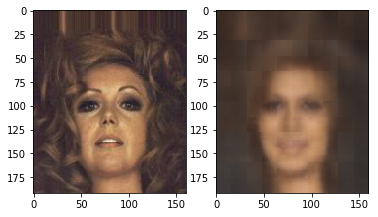

	Epoch 0 batch 5000 loss: 0.008192154578864574
	Epoch 0 batch 6000 loss: 0.007165079936385155
	Epoch 0 batch 7000 loss: 0.007557379547506571
	Epoch 0 batch 8000 loss: 0.007831682451069355


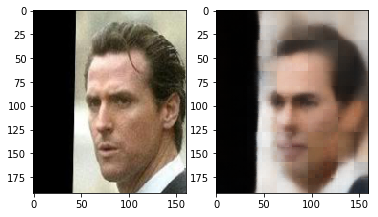

Epoch: 0 Loss: 102.85206137597561


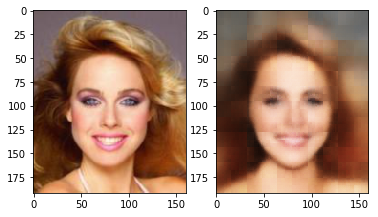

	Epoch 1 batch 1000 loss: 0.0075658769346773624
	Epoch 1 batch 2000 loss: 0.008307033218443394
	Epoch 1 batch 3000 loss: 0.006739325821399689
	Epoch 1 batch 4000 loss: 0.007042287848889828


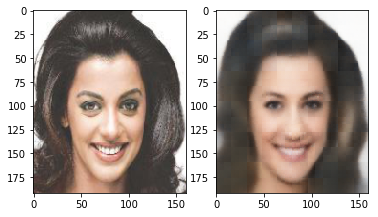

	Epoch 1 batch 5000 loss: 0.008526580408215523
	Epoch 1 batch 6000 loss: 0.006480016745626926
	Epoch 1 batch 7000 loss: 0.006377412471920252
	Epoch 1 batch 8000 loss: 0.004928329959511757


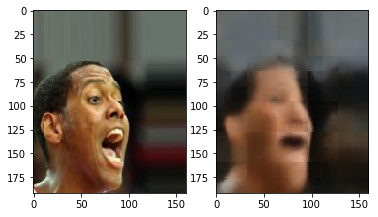

Epoch: 1 Loss: 56.56526125129312


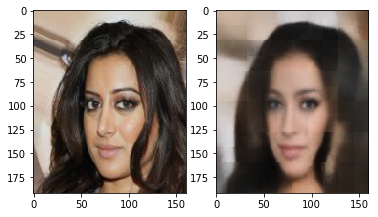

	Epoch 2 batch 1000 loss: 0.005173364654183388
	Epoch 2 batch 2000 loss: 0.006225187331438065
	Epoch 2 batch 3000 loss: 0.006132133305072784
	Epoch 2 batch 4000 loss: 0.005970087833702564


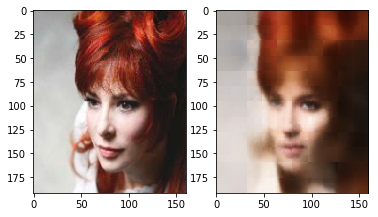

	Epoch 2 batch 5000 loss: 0.0055773621425032616
	Epoch 2 batch 6000 loss: 0.006306837312877178
	Epoch 2 batch 7000 loss: 0.005459856707602739
	Epoch 2 batch 8000 loss: 0.004882990848273039


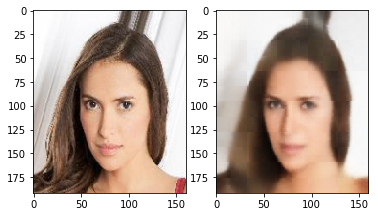

Epoch: 2 Loss: 46.849279689835384


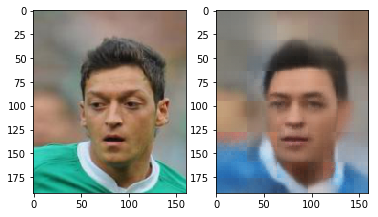

Copying file://model2.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=3, display_images=1, scheduler=scheduler, save_path="model2.pt")

	Epoch 0 batch 1000 loss: 0.0036196401342749596
	Epoch 0 batch 2000 loss: 0.0031589067075401545
	Epoch 0 batch 3000 loss: 0.0034027271904051304
	Epoch 0 batch 4000 loss: 0.003497451776638627
	Epoch 0 batch 5000 loss: 0.00316902669146657


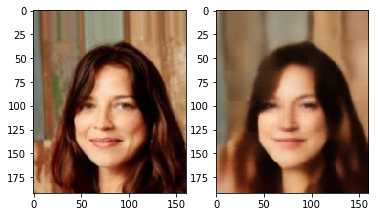

	Epoch 0 batch 6000 loss: 0.0034280873369425535
	Epoch 0 batch 7000 loss: 0.003929504659026861
	Epoch 0 batch 8000 loss: 0.0035506414715200663
	Epoch 0 batch 9000 loss: 0.003491127397865057
	Epoch 0 batch 10000 loss: 0.0036985131446272135


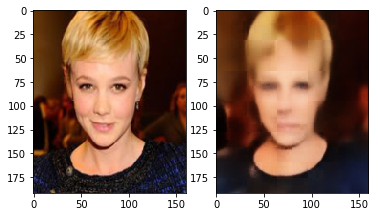

	Epoch 0 batch 11000 loss: 0.003952535334974527
	Epoch 0 batch 12000 loss: 0.00317810894921422
	Epoch 0 batch 13000 loss: 0.0033850285690277815
Epoch: 0 Loss: 47.506920186337084


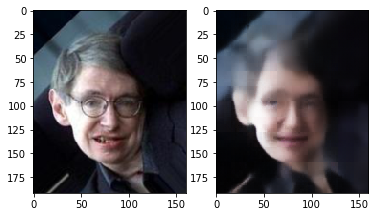

	Epoch 1 batch 1000 loss: 0.003523718798533082
	Epoch 1 batch 2000 loss: 0.003813094925135374
	Epoch 1 batch 3000 loss: 0.004051394294947386
	Epoch 1 batch 4000 loss: 0.003298309165984392
	Epoch 1 batch 5000 loss: 0.003294870024546981


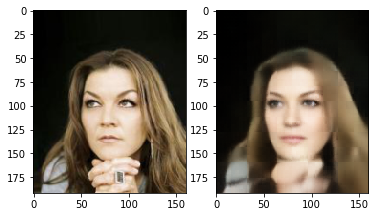

	Epoch 1 batch 6000 loss: 0.00343700940720737
	Epoch 1 batch 7000 loss: 0.0034440564922988415
	Epoch 1 batch 8000 loss: 0.0033164501655846834
	Epoch 1 batch 9000 loss: 0.003168733324855566
	Epoch 1 batch 10000 loss: 0.00360969640314579


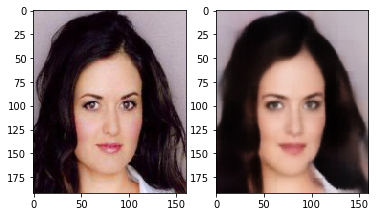

	Epoch 1 batch 11000 loss: 0.0030437472742050886
	Epoch 1 batch 12000 loss: 0.0031402611639350653
	Epoch 1 batch 13000 loss: 0.0034301637206226587
Epoch: 1 Loss: 45.45754879177548


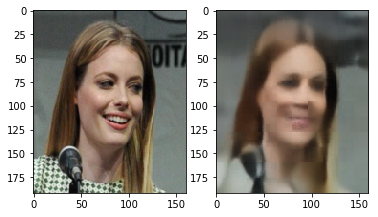

	Epoch 2 batch 1000 loss: 0.0036964653991162777
	Epoch 2 batch 2000 loss: 0.0033757358323782682
	Epoch 2 batch 3000 loss: 0.0041319276206195354
	Epoch 2 batch 4000 loss: 0.003515122924000025
	Epoch 2 batch 5000 loss: 0.0033047974575310946


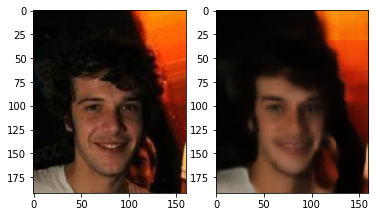

	Epoch 2 batch 6000 loss: 0.003218171652406454
	Epoch 2 batch 7000 loss: 0.0030756155028939247
	Epoch 2 batch 8000 loss: 0.0028461043257266283
	Epoch 2 batch 9000 loss: 0.002960378071293235
	Epoch 2 batch 10000 loss: 0.0028506279923021793


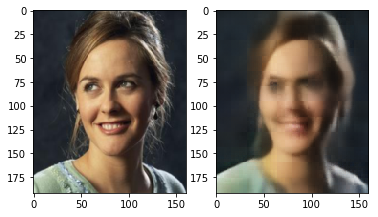

	Epoch 2 batch 11000 loss: 0.0031730751506984234
	Epoch 2 batch 12000 loss: 0.003118491033092141
	Epoch 2 batch 13000 loss: 0.0032975084614008665
Epoch: 2 Loss: 43.88405291503295


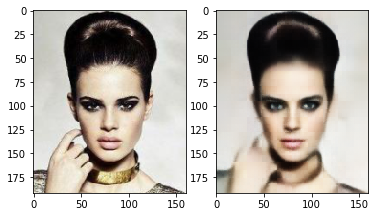

	Epoch 3 batch 1000 loss: 0.004009169992059469
	Epoch 3 batch 2000 loss: 0.0027337810024619102
	Epoch 3 batch 3000 loss: 0.0034522898495197296
	Epoch 3 batch 4000 loss: 0.003627815516665578
	Epoch 3 batch 5000 loss: 0.002881338819861412


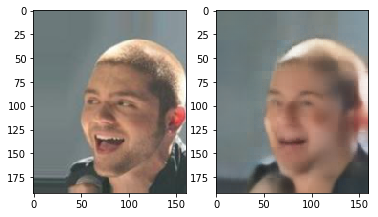

	Epoch 3 batch 6000 loss: 0.0033167689107358456
	Epoch 3 batch 7000 loss: 0.0030668554827570915
	Epoch 3 batch 8000 loss: 0.003946192096918821
	Epoch 3 batch 9000 loss: 0.003514156909659505
	Epoch 3 batch 10000 loss: 0.0029286884237080812


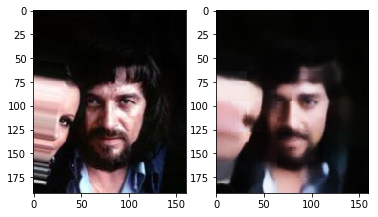

	Epoch 3 batch 11000 loss: 0.0030790267046540976
	Epoch 3 batch 12000 loss: 0.003091619350016117
	Epoch 3 batch 13000 loss: 0.0036645354703068733
Epoch: 3 Loss: 42.58788325637579


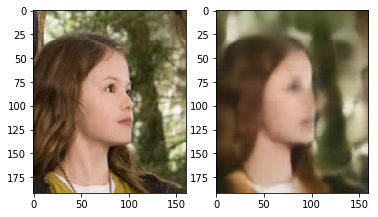

	Epoch 4 batch 1000 loss: 0.0022712426725775003
	Epoch 4 batch 2000 loss: 0.002512581180781126
	Epoch 4 batch 3000 loss: 0.0027140735182911158
	Epoch 4 batch 4000 loss: 0.0038018703926354647
	Epoch 4 batch 5000 loss: 0.003257815958932042


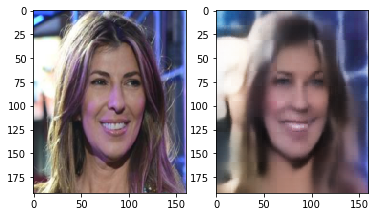

	Epoch 4 batch 6000 loss: 0.0033210318069905043
	Epoch 4 batch 7000 loss: 0.0027282622177153826
	Epoch 4 batch 8000 loss: 0.003108779201284051
	Epoch 4 batch 9000 loss: 0.002492377534508705
	Epoch 4 batch 10000 loss: 0.0028161071240901947


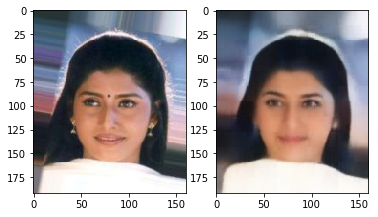

	Epoch 4 batch 11000 loss: 0.0028421932365745306
	Epoch 4 batch 12000 loss: 0.0031443717889487743
	Epoch 4 batch 13000 loss: 0.0026796229649335146
Epoch: 4 Loss: 41.4885828247061


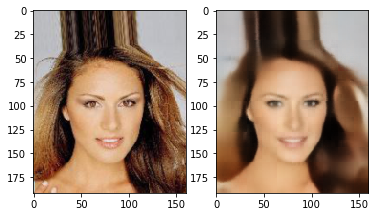

Copying file://model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler, save_path="model.pt")

	Epoch 1 batch 1000 loss: 0.003216432174667716
	Epoch 1 batch 2000 loss: 0.0033654680009931326
	Epoch 1 batch 3000 loss: 0.0030786602292209864
	Epoch 1 batch 4000 loss: 0.0032002420630306005
	Epoch 1 batch 5000 loss: 0.002923504915088415


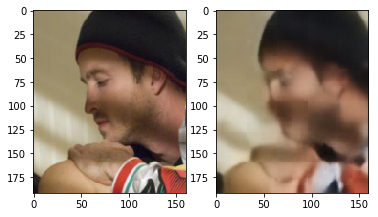

	Epoch 1 batch 6000 loss: 0.0033065236639231443
	Epoch 1 batch 7000 loss: 0.0032637924887239933
	Epoch 1 batch 8000 loss: 0.003434465266764164
	Epoch 1 batch 9000 loss: 0.0034182975068688393
	Epoch 1 batch 10000 loss: 0.002746678190305829


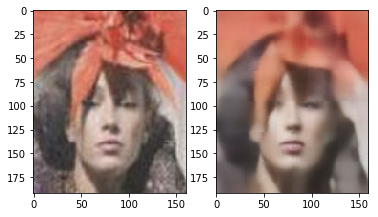

	Epoch 1 batch 11000 loss: 0.0030647909734398127
	Epoch 1 batch 12000 loss: 0.003079672111198306
	Epoch 1 batch 13000 loss: 0.0025951475836336613
Epoch: 1 Loss: 40.54229741031304


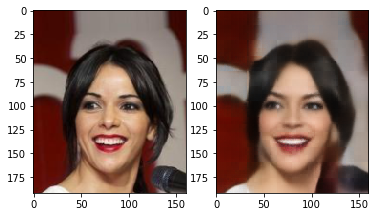

	Epoch 2 batch 1000 loss: 0.003234660718590021
	Epoch 2 batch 2000 loss: 0.0029278413858264685
	Epoch 2 batch 3000 loss: 0.003321397816762328
	Epoch 2 batch 4000 loss: 0.0029560786206275225
	Epoch 2 batch 5000 loss: 0.0028746810276061296


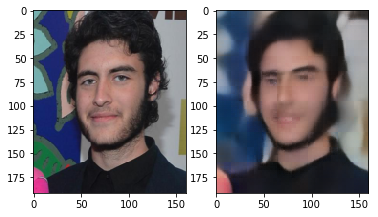

	Epoch 2 batch 6000 loss: 0.0034135612659156322
	Epoch 2 batch 7000 loss: 0.002506223740056157
	Epoch 2 batch 8000 loss: 0.003430714597925544
	Epoch 2 batch 9000 loss: 0.0027178102172911167
	Epoch 2 batch 10000 loss: 0.0034236216451972723


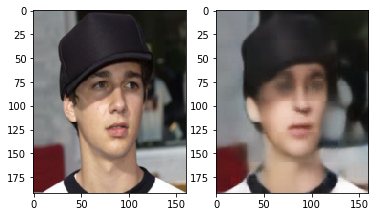

	Epoch 2 batch 11000 loss: 0.0027403756976127625
	Epoch 2 batch 12000 loss: 0.002707657404243946
	Epoch 2 batch 13000 loss: 0.003143872832879424
Epoch: 2 Loss: 39.68266446806956


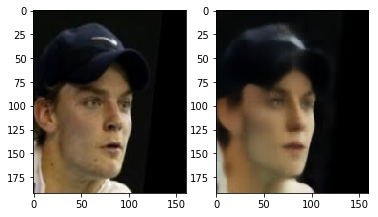

	Epoch 3 batch 1000 loss: 0.003013966139405966
	Epoch 3 batch 2000 loss: 0.0027005465235561132
	Epoch 3 batch 3000 loss: 0.0028411895036697388
	Epoch 3 batch 4000 loss: 0.002948692999780178
	Epoch 3 batch 5000 loss: 0.0025186866987496614


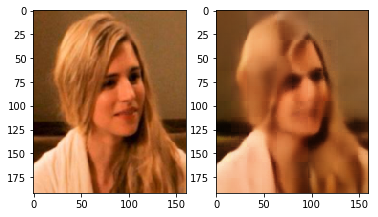

	Epoch 3 batch 6000 loss: 0.0029709446243941784
	Epoch 3 batch 7000 loss: 0.0034389884676784277
	Epoch 3 batch 8000 loss: 0.004026921931654215
	Epoch 3 batch 9000 loss: 0.003252078080549836
	Epoch 3 batch 10000 loss: 0.003030529711395502


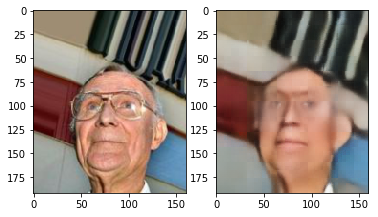

	Epoch 3 batch 11000 loss: 0.0024737631902098656
	Epoch 3 batch 12000 loss: 0.0030298049096018076
	Epoch 3 batch 13000 loss: 0.0022702550049871206
Epoch: 3 Loss: 38.94098194933031


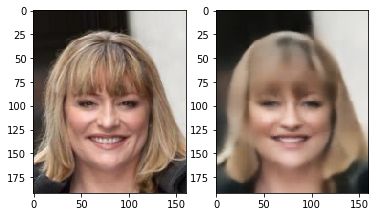

	Epoch 4 batch 1000 loss: 0.0029535270296037197
	Epoch 4 batch 2000 loss: 0.0026432271115481853
	Epoch 4 batch 3000 loss: 0.0030823417473584414
	Epoch 4 batch 4000 loss: 0.0026696620043367147
	Epoch 4 batch 5000 loss: 0.002282398287206888


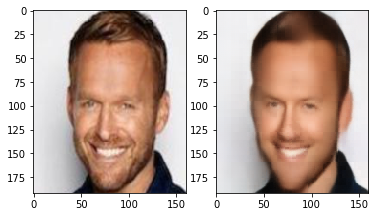

	Epoch 4 batch 6000 loss: 0.0026338843163102865
	Epoch 4 batch 7000 loss: 0.0025204909034073353
	Epoch 4 batch 8000 loss: 0.0027779480442404747
	Epoch 4 batch 9000 loss: 0.0029528855811804533
	Epoch 4 batch 10000 loss: 0.0027516752015799284


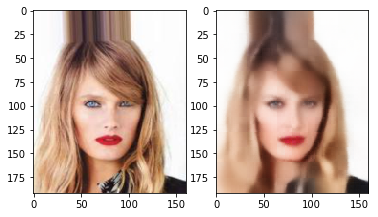

	Epoch 4 batch 11000 loss: 0.0025047638919204473
	Epoch 4 batch 12000 loss: 0.002448098035529256
	Epoch 4 batch 13000 loss: 0.0025257619563490152
Epoch: 4 Loss: 38.25629074824974


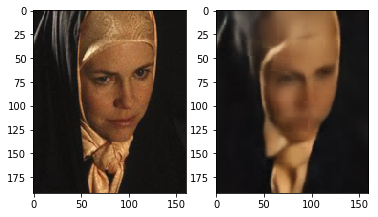

	Epoch 5 batch 1000 loss: 0.002950243651866913
	Epoch 5 batch 2000 loss: 0.0037376724649220705
	Epoch 5 batch 3000 loss: 0.0024380055256187916
	Epoch 5 batch 4000 loss: 0.0027973740361630917
	Epoch 5 batch 5000 loss: 0.003047941718250513


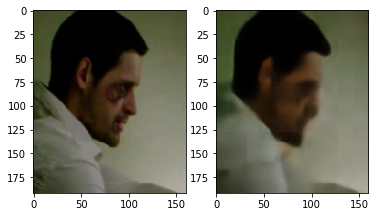

	Epoch 5 batch 6000 loss: 0.0032714013941586018
	Epoch 5 batch 7000 loss: 0.0025744186714291573
	Epoch 5 batch 8000 loss: 0.0027728143613785505
	Epoch 5 batch 9000 loss: 0.002476884750649333
	Epoch 5 batch 10000 loss: 0.0022751358337700367


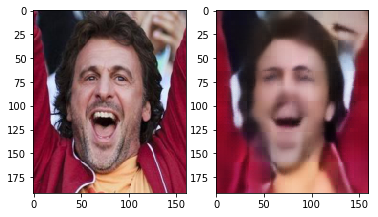

	Epoch 5 batch 11000 loss: 0.002376712393015623
	Epoch 5 batch 12000 loss: 0.0023104604333639145
	Epoch 5 batch 13000 loss: 0.002897653030231595
Epoch: 5 Loss: 37.65975632192567


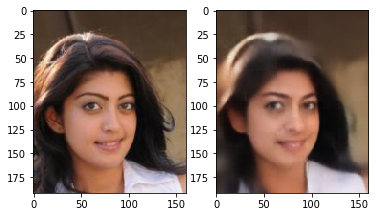

Copying file://./model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 4 batch 1000 loss: 0.0026217573322355747
	Epoch 4 batch 2000 loss: 0.002801616443321109
	Epoch 4 batch 3000 loss: 0.0028743078000843525
	Epoch 4 batch 4000 loss: 0.0026171449571847916
	Epoch 4 batch 5000 loss: 0.002820628462359309


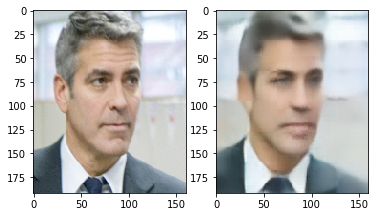

	Epoch 4 batch 6000 loss: 0.0028296862728893757
	Epoch 4 batch 7000 loss: 0.0031794062815606594
	Epoch 4 batch 8000 loss: 0.0028124197851866484
Epoch: 4 Loss: 24.9157399518881


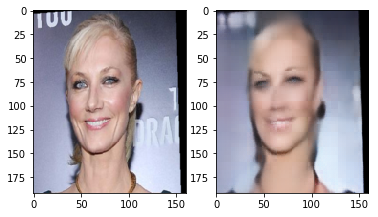

	Epoch 5 batch 1000 loss: 0.0024748779833316803
	Epoch 5 batch 2000 loss: 0.0028761615976691246
	Epoch 5 batch 3000 loss: 0.0030671744607388973
	Epoch 5 batch 4000 loss: 0.0028333652298897505
	Epoch 5 batch 5000 loss: 0.0025735499802976847


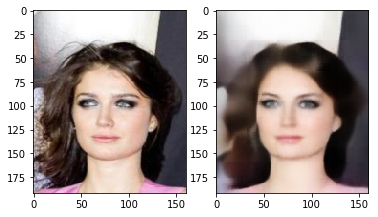

	Epoch 5 batch 6000 loss: 0.0029600840061903
	Epoch 5 batch 7000 loss: 0.0026823680382221937
	Epoch 5 batch 8000 loss: 0.0026359723415225744
Epoch: 5 Loss: 24.605885779717937


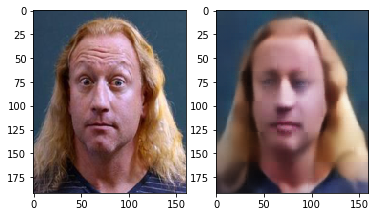

	Epoch 6 batch 1000 loss: 0.0025043103378266096
	Epoch 6 batch 2000 loss: 0.003047137288376689
	Epoch 6 batch 3000 loss: 0.002555579412728548
	Epoch 6 batch 4000 loss: 0.0025125101674348116
	Epoch 6 batch 5000 loss: 0.0025215051136910915


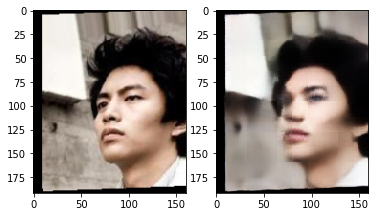

	Epoch 6 batch 6000 loss: 0.0024781099054962397
	Epoch 6 batch 7000 loss: 0.003107319585978985
	Epoch 6 batch 8000 loss: 0.0026419623754918575
Epoch: 6 Loss: 24.315588123863563


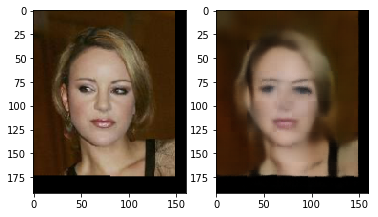

	Epoch 7 batch 1000 loss: 0.002651381306350231
	Epoch 7 batch 2000 loss: 0.002637845929712057
	Epoch 7 batch 3000 loss: 0.002553140977397561
	Epoch 7 batch 4000 loss: 0.0026380340568721294
	Epoch 7 batch 5000 loss: 0.0024332019966095686


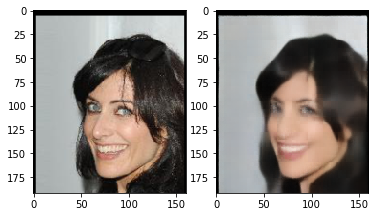

	Epoch 7 batch 6000 loss: 0.002829459495842457
	Epoch 7 batch 7000 loss: 0.002960742684081197
	Epoch 7 batch 8000 loss: 0.0023971381597220898
Epoch: 7 Loss: 24.046044768183492


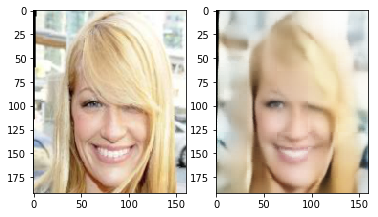

	Epoch 8 batch 1000 loss: 0.0029807998798787594
	Epoch 8 batch 2000 loss: 0.002576981671154499
	Epoch 8 batch 3000 loss: 0.0028685303404927254
	Epoch 8 batch 4000 loss: 0.0028079438488930464
	Epoch 8 batch 5000 loss: 0.002942522754892707


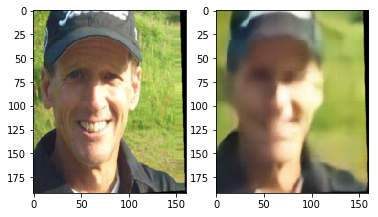

	Epoch 8 batch 6000 loss: 0.0025545931421220303
	Epoch 8 batch 7000 loss: 0.0030597711447626352
	Epoch 8 batch 8000 loss: 0.0025980165228247643
Epoch: 8 Loss: 23.78418816695921


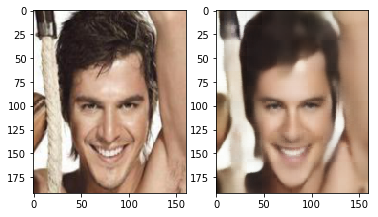

Copying file://model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 0 batch 1000 loss: 0.0025581882800906897
	Epoch 0 batch 2000 loss: 0.0027806819416582584
	Epoch 0 batch 3000 loss: 0.0023531417828053236
	Epoch 0 batch 4000 loss: 0.002443840727210045


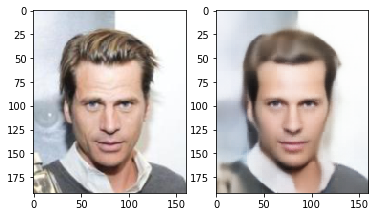

	Epoch 0 batch 5000 loss: 0.0025192692410200834
	Epoch 0 batch 6000 loss: 0.002524422248825431
Epoch: 0 Loss: 15.155607343884185


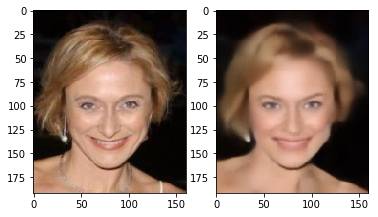

	Epoch 1 batch 1000 loss: 0.0023727535735815763
	Epoch 1 batch 2000 loss: 0.0021520652808248997
	Epoch 1 batch 3000 loss: 0.002499517984688282
	Epoch 1 batch 4000 loss: 0.0024698616471141577


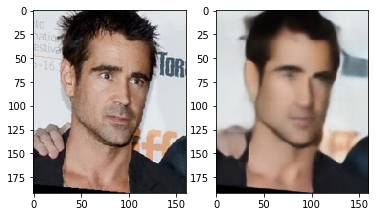

	Epoch 1 batch 5000 loss: 0.0025580679066479206
	Epoch 1 batch 6000 loss: 0.002422071062028408
Epoch: 1 Loss: 15.01789468107745


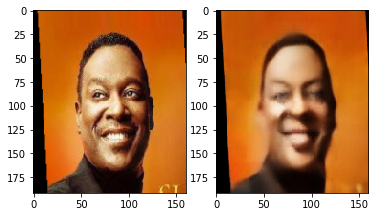

	Epoch 2 batch 1000 loss: 0.0023950464092195034
	Epoch 2 batch 2000 loss: 0.0022107111290097237
	Epoch 2 batch 3000 loss: 0.002769899321720004
	Epoch 2 batch 4000 loss: 0.002261259825900197


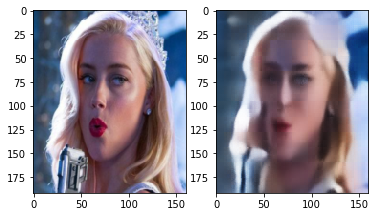

	Epoch 2 batch 5000 loss: 0.0021112076938152313
	Epoch 2 batch 6000 loss: 0.002276487648487091
Epoch: 2 Loss: 14.92944770352915


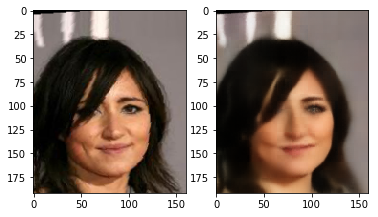

	Epoch 3 batch 1000 loss: 0.0025501365307718515
	Epoch 3 batch 2000 loss: 0.002350993687286973
	Epoch 3 batch 3000 loss: 0.0021875821985304356
	Epoch 3 batch 4000 loss: 0.0022688370663672686


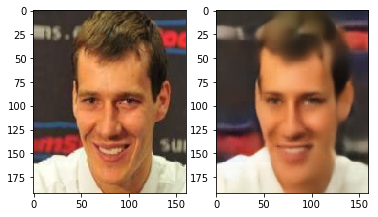

	Epoch 3 batch 5000 loss: 0.002351337345317006
	Epoch 3 batch 6000 loss: 0.001953081344254315
Epoch: 3 Loss: 14.83947454416193


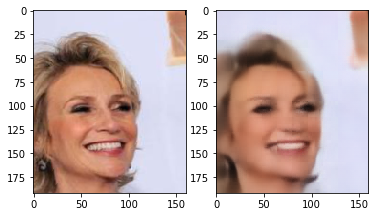

Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

Interrupting... Saving model...
Copying file://model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/377.5 MiB.                                    


In [22]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 4 batch 1000 loss: 0.0025130424182862043
	Epoch 4 batch 2000 loss: 0.002509158570319414
	Epoch 4 batch 3000 loss: 0.0022567627020180225
	Epoch 4 batch 4000 loss: 0.00223985081538558


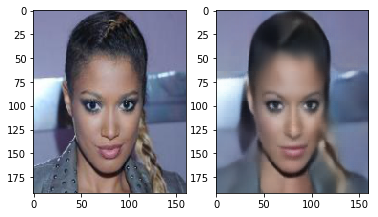

	Epoch 4 batch 5000 loss: 0.0026965944562107325
	Epoch 4 batch 6000 loss: 0.0023813217412680387
Epoch: 4 Loss: 14.898046465823427


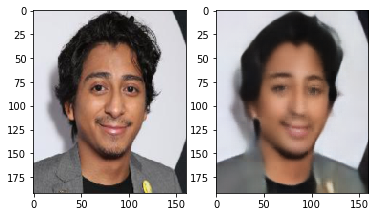

	Epoch 5 batch 1000 loss: 0.002203111071139574
	Epoch 5 batch 2000 loss: 0.0024279316421598196
	Epoch 5 batch 3000 loss: 0.0021924087777733803
	Epoch 5 batch 4000 loss: 0.002409212524071336


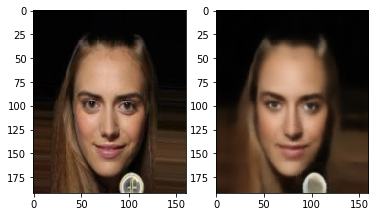

	Epoch 5 batch 5000 loss: 0.0023468530271202326
	Epoch 5 batch 6000 loss: 0.002383666578680277
Epoch: 5 Loss: 14.813849906553514


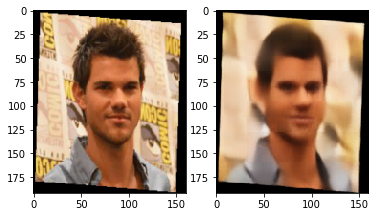

	Epoch 6 batch 1000 loss: 0.002401654375717044
	Epoch 6 batch 2000 loss: 0.0025284914299845695
	Epoch 6 batch 3000 loss: 0.0023519094102084637
	Epoch 6 batch 4000 loss: 0.0023629427887499332


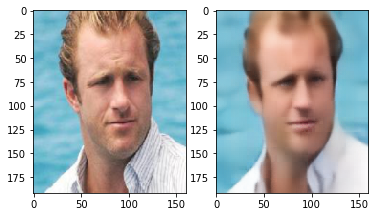

	Epoch 6 batch 5000 loss: 0.0023812123108655214
	Epoch 6 batch 6000 loss: 0.002190407831221819
Epoch: 6 Loss: 14.734262774232775


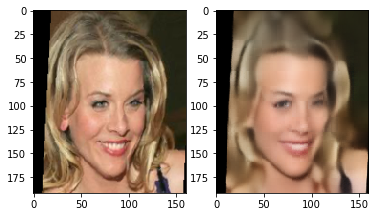

	Epoch 7 batch 1000 loss: 0.002333871554583311
	Epoch 7 batch 2000 loss: 0.0024319335352629423
	Epoch 7 batch 3000 loss: 0.0023321788758039474
	Epoch 7 batch 4000 loss: 0.002407257677987218


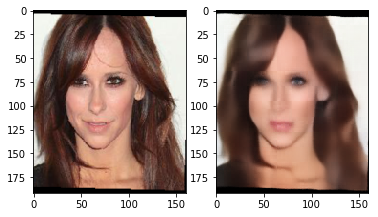

	Epoch 7 batch 5000 loss: 0.0022948309779167175
	Epoch 7 batch 6000 loss: 0.0023320221807807684
Epoch: 7 Loss: 14.659077756339684


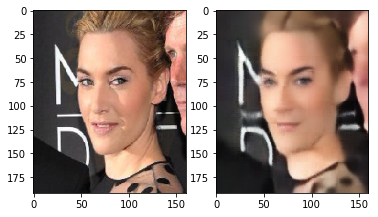

	Epoch 8 batch 1000 loss: 0.0020987573079764843


Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken p

Interrupting... Saving model...
Copying file://model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/377.5 MiB.                                    


In [28]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 0 batch 1000 loss: 0.0024414104409515858
	Epoch 0 batch 2000 loss: 0.0024037621915340424
	Epoch 0 batch 3000 loss: 0.0022127004340291023
	Epoch 0 batch 4000 loss: 0.002590788761153817


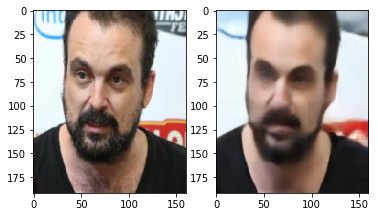

	Epoch 0 batch 5000 loss: 0.002489878097549081
	Epoch 0 batch 6000 loss: 0.002669230569154024
	Epoch 0 batch 7000 loss: 0.002128500724211335
	Epoch 0 batch 8000 loss: 0.0024101382587105036


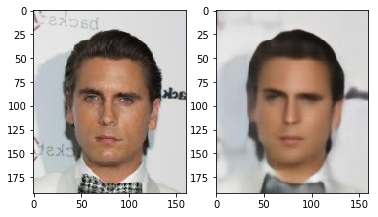

Epoch: 0 Loss: 19.59466947510373


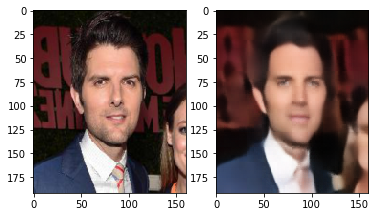

	Epoch 1 batch 1000 loss: 0.0019932352006435394
	Epoch 1 batch 2000 loss: 0.00210070819593966
	Epoch 1 batch 3000 loss: 0.002629400696605444
	Epoch 1 batch 4000 loss: 0.0025208524893969297


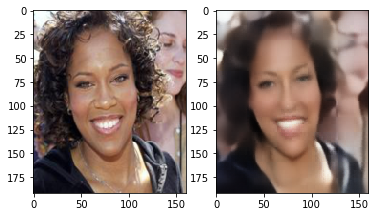

	Epoch 1 batch 5000 loss: 0.0027381572872400284
	Epoch 1 batch 6000 loss: 0.002388190245255828
	Epoch 1 batch 7000 loss: 0.002253378974273801
	Epoch 1 batch 8000 loss: 0.0023411251604557037


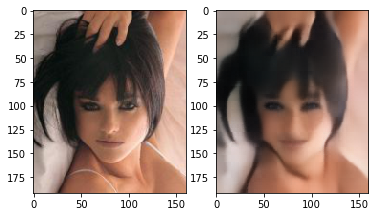

Epoch: 1 Loss: 19.475816283840686


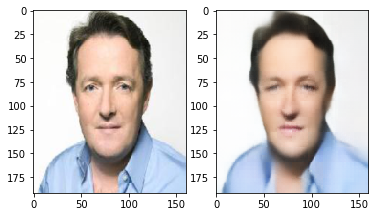

	Epoch 2 batch 1000 loss: 0.002719446085393429
	Epoch 2 batch 2000 loss: 0.002295457059517503
	Epoch 2 batch 3000 loss: 0.00221435003913939
	Epoch 2 batch 4000 loss: 0.0024100400041788816


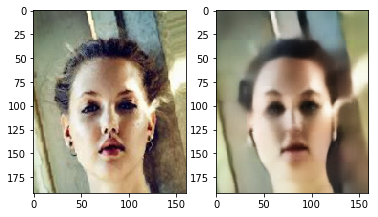

	Epoch 2 batch 5000 loss: 0.0020769464317709208
	Epoch 2 batch 6000 loss: 0.0023555783554911613
	Epoch 2 batch 7000 loss: 0.0024498372804373503
	Epoch 2 batch 8000 loss: 0.0023484909906983376


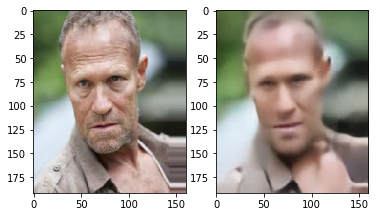

Epoch: 2 Loss: 19.37046376510989


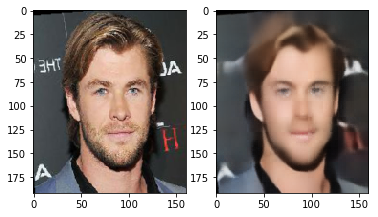

	Epoch 3 batch 1000 loss: 0.002023902256041765
	Epoch 3 batch 2000 loss: 0.0021753432229161263
	Epoch 3 batch 3000 loss: 0.0023284684866666794
	Epoch 3 batch 4000 loss: 0.002301619155332446


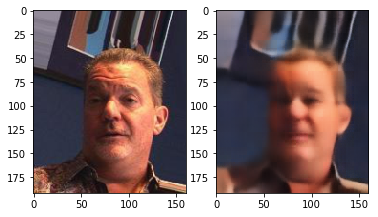

	Epoch 3 batch 5000 loss: 0.002416335977613926
	Epoch 3 batch 6000 loss: 0.002479362301528454
	Epoch 3 batch 7000 loss: 0.002545012393966317
	Epoch 3 batch 8000 loss: 0.0021800315007567406


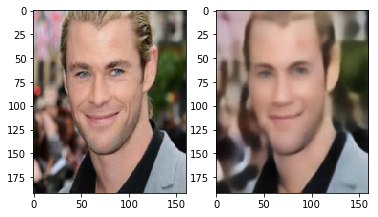

Epoch: 3 Loss: 19.26370477222372


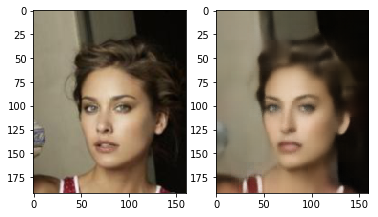

	Epoch 4 batch 1000 loss: 0.0022476620506495237
	Epoch 4 batch 2000 loss: 0.002552132587879896
	Epoch 4 batch 3000 loss: 0.0023770686239004135
	Epoch 4 batch 4000 loss: 0.002432678360491991


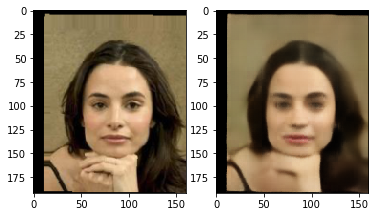

	Epoch 4 batch 5000 loss: 0.0022344491444528103
	Epoch 4 batch 6000 loss: 0.0024764444679021835
	Epoch 4 batch 7000 loss: 0.002350184600800276
	Epoch 4 batch 8000 loss: 0.0024071631487458944


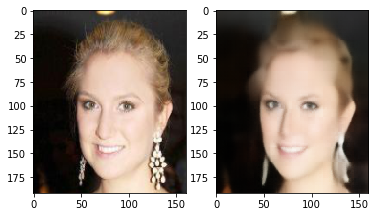

Epoch: 4 Loss: 19.159168503363617


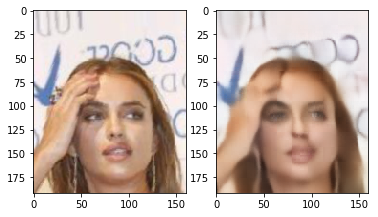

Copying file://model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/377.5 MiB.                                    


In [14]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 5 batch 1000 loss: 0.0023938121739774942
	Epoch 5 batch 2000 loss: 0.0026851436123251915
	Epoch 5 batch 3000 loss: 0.002450171858072281
	Epoch 5 batch 4000 loss: 0.0023819436319172382


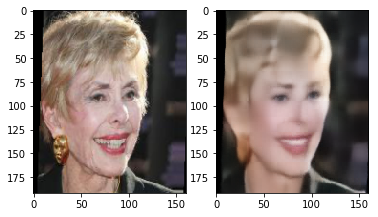

	Epoch 5 batch 5000 loss: 0.0024365468416363
	Epoch 5 batch 6000 loss: 0.002491097431629896
	Epoch 5 batch 7000 loss: 0.0020975663792341948
	Epoch 5 batch 8000 loss: 0.002308168215677142


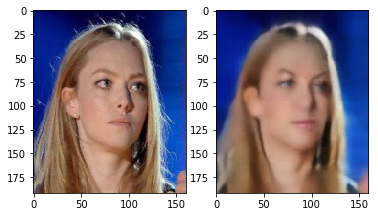

Epoch: 5 Loss: 19.053271290147677


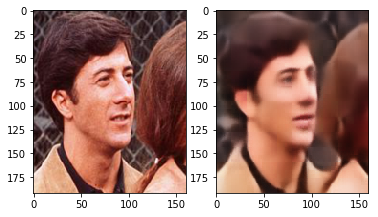

	Epoch 6 batch 1000 loss: 0.0019197181100025773
	Epoch 6 batch 2000 loss: 0.0022405372001230717
	Epoch 6 batch 3000 loss: 0.0021976171992719173
	Epoch 6 batch 4000 loss: 0.0025303540751338005


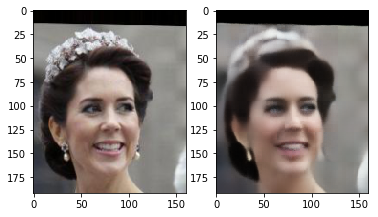

	Epoch 6 batch 5000 loss: 0.0021257696207612753
	Epoch 6 batch 6000 loss: 0.0023792125284671783
	Epoch 6 batch 7000 loss: 0.0023934170603752136


In [0]:
  train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 0 batch 1000 loss: 0.0025858073495328426
	Epoch 0 batch 2000 loss: 0.002224820200353861
	Epoch 0 batch 3000 loss: 0.0026013862807303667
	Epoch 0 batch 4000 loss: 0.0022980773355811834
	Epoch 0 batch 5000 loss: 0.0024104658514261246


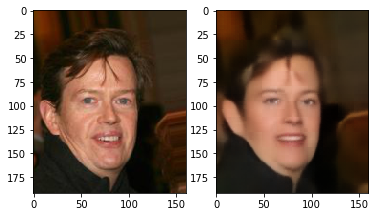

	Epoch 0 batch 6000 loss: 0.002762452932074666
	Epoch 0 batch 7000 loss: 0.002055712742730975
	Epoch 0 batch 8000 loss: 0.002491527935490012
Epoch: 0 Loss: 20.33413466287311


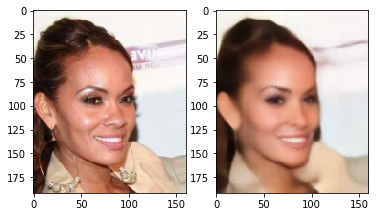

	Epoch 1 batch 1000 loss: 0.0018923886818811297
	Epoch 1 batch 2000 loss: 0.0021841926500201225
	Epoch 1 batch 3000 loss: 0.0025778948329389095
	Epoch 1 batch 4000 loss: 0.002605570014566183
	Epoch 1 batch 5000 loss: 0.0025048265233635902


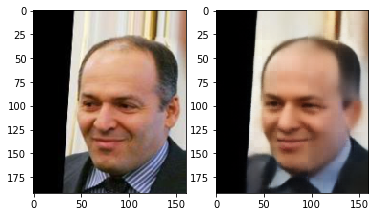

	Epoch 1 batch 6000 loss: 0.00240408000536263
	Epoch 1 batch 7000 loss: 0.0024297761265188456
	Epoch 1 batch 8000 loss: 0.0019627430010586977
Epoch: 1 Loss: 20.137719092774205


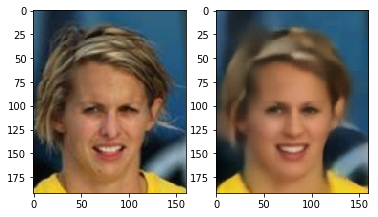

	Epoch 2 batch 1000 loss: 0.002582891844213009
	Epoch 2 batch 2000 loss: 0.002072312170639634
	Epoch 2 batch 3000 loss: 0.002146682236343622
	Epoch 2 batch 4000 loss: 0.0023515289649367332
	Epoch 2 batch 5000 loss: 0.0022671262267977


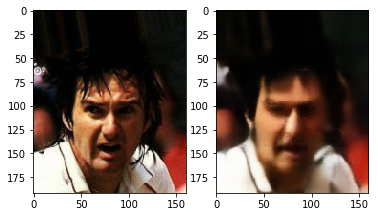

	Epoch 2 batch 6000 loss: 0.0025998211931437254
	Epoch 2 batch 7000 loss: 0.002374059520661831
	Epoch 2 batch 8000 loss: 0.002409591805189848
Epoch: 2 Loss: 20.007904844824225


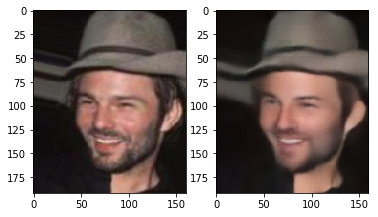

	Epoch 3 batch 1000 loss: 0.0027813788037747145
	Epoch 3 batch 2000 loss: 0.0021241018548607826
	Epoch 3 batch 3000 loss: 0.0026528635062277317
	Epoch 3 batch 4000 loss: 0.002541405614465475
	Epoch 3 batch 5000 loss: 0.0022329019848257303


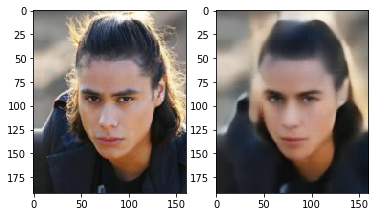

	Epoch 3 batch 6000 loss: 0.0022503077052533627
	Epoch 3 batch 7000 loss: 0.003144806018099189
	Epoch 3 batch 8000 loss: 0.0023865920957177877
Epoch: 3 Loss: 19.885351300006732


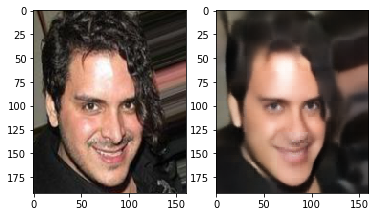

	Epoch 4 batch 1000 loss: 0.002594258636236191
	Epoch 4 batch 2000 loss: 0.002116553019732237
	Epoch 4 batch 3000 loss: 0.002567373448982835
	Epoch 4 batch 4000 loss: 0.0021618781611323357
	Epoch 4 batch 5000 loss: 0.002712349873036146


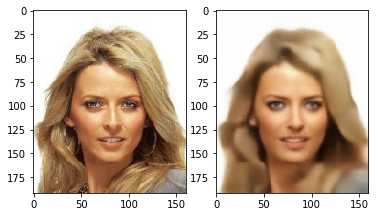

	Epoch 4 batch 6000 loss: 0.0021524173207581043
	Epoch 4 batch 7000 loss: 0.0022971713915467262
	Epoch 4 batch 8000 loss: 0.0021499793510884047
Epoch: 4 Loss: 19.76576062850654


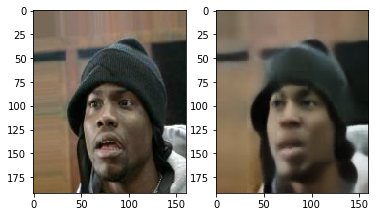

Copying file://./model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
  train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

	Epoch 0 batch 1000 loss: 0.0024678846821188927
	Epoch 0 batch 2000 loss: 0.0028790975920856
	Epoch 0 batch 3000 loss: 0.0025425569619983435
	Epoch 0 batch 4000 loss: 0.003289396408945322
	Epoch 0 batch 5000 loss: 0.0030311760492622852


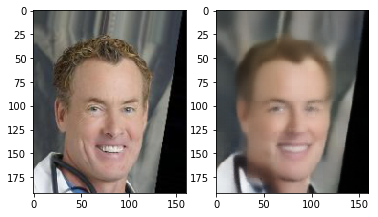

	Epoch 0 batch 6000 loss: 0.0029575368389487267
	Epoch 0 batch 7000 loss: 0.0027934908866882324
	Epoch 0 batch 8000 loss: 0.0040534487925469875
	Epoch 0 batch 9000 loss: 0.0020296520087867975
	Epoch 0 batch 10000 loss: 0.0025599368382245302


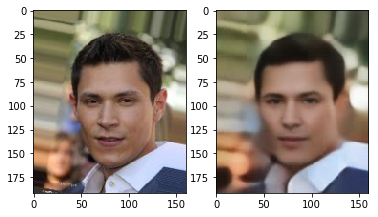

	Epoch 0 batch 11000 loss: 0.002532819751650095
	Epoch 0 batch 12000 loss: 0.0027584070339798927
	Epoch 0 batch 13000 loss: 0.0029351632110774517
Epoch: 0 Loss: 34.42653483187314


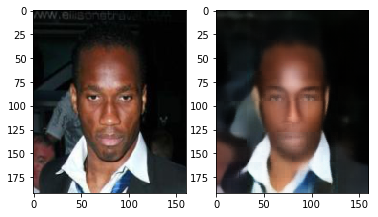

	Epoch 1 batch 1000 loss: 0.002625835593789816
	Epoch 1 batch 2000 loss: 0.0024477432016283274
	Epoch 1 batch 3000 loss: 0.002425187500193715
	Epoch 1 batch 4000 loss: 0.0027994471602141857
	Epoch 1 batch 5000 loss: 0.0023880773223936558


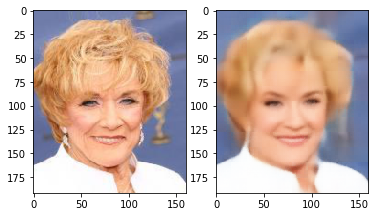

	Epoch 1 batch 6000 loss: 0.002384057268500328
	Epoch 1 batch 7000 loss: 0.0022754850797355175
	Epoch 1 batch 8000 loss: 0.002390699228271842
	Epoch 1 batch 9000 loss: 0.0025499139446765184
	Epoch 1 batch 10000 loss: 0.0025448256637901068


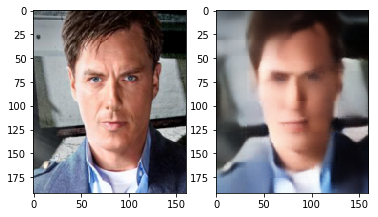

	Epoch 1 batch 11000 loss: 0.0021609370596706867
	Epoch 1 batch 12000 loss: 0.0020077882800251245
	Epoch 1 batch 13000 loss: 0.002335896948352456
Epoch: 1 Loss: 33.84890352119692


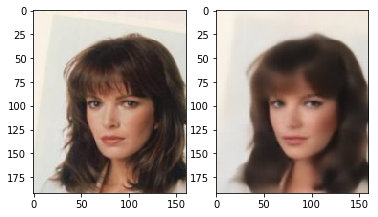

Copying file://./model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

Resuming upload for file://./model.pt
Catching up md5 for file://./model.pt...
Failure: md5 signature computed for local file (UAOOgSg52/E4ZrKC78yGGA==) doesn't match cloud-supplied digest (ZkXaR86REf6WdUIyYBl5Qw==). Cloud object (gs://pneumonia/model.pt)

In [0]:
train(model, train_loader, optimizer, print_metrics=0, num_epochs=2, display_images=1, scheduler=scheduler)

	Epoch 0 batch 1000 loss: 0.004357167519629002
	Epoch 0 batch 2000 loss: 0.004770121071487665
	Epoch 0 batch 3000 loss: 0.0038511320017278194
	Epoch 0 batch 4000 loss: 0.004200455266982317
	Epoch 0 batch 5000 loss: 0.0030665146186947823


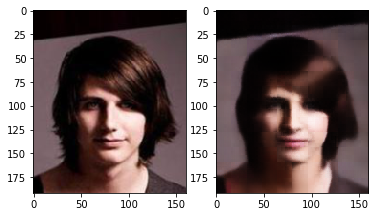

	Epoch 0 batch 6000 loss: 0.0031454518903046846
	Epoch 0 batch 7000 loss: 0.00357736530713737
Interrupting... Saving model...
Copying file://./model.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/377.5 MiB.                                    


In [0]:
  train(model, train_loader, optimizer, print_metrics=0, num_epochs=8, display_images=1, scheduler=scheduler)

In [0]:
  train(model, train_loader, optimizer, print_metrics=0, num_epochs=5, display_images=1, scheduler=scheduler)

Interrupting... Saving model...


KeyboardInterrupt: ignored

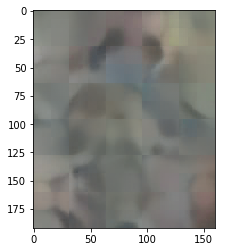

In [0]:
noise = np.random.normal(loc=0.3, scale=7.5, size=4096).reshape((1,4096,1,1))
image = model.decoder(torch.from_numpy(noise).cuda().float())
plt.imshow(image[0].cpu().detach().permute(1,2,0))
plt.show()

In [0]:
# # download and unzip the data
# url = "https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_64x64.zip"
# if not os.path.exists("gwb_images.zip"):
#   wget.download(url, 'gwb_images.zip')

#   zip_ref = zipfile.ZipFile('gwb_images.zip', 'r')
#   zip_ref.extractall('data/gwb')
#   zip_ref.close()

In [0]:
# use the existing encoder to create a GWBush decoder
from torch import optim
import numpy as np

  ## YOUR CODE HERE ##
encoder = model.encoder
gwb_decoder = Decoder(2048)
gwb_model = SingleModel(encoder, gwb_decoder)
gwb_params = gwb_model.decoder.parameters()

# run on GPU
use_cuda = True

if use_cuda and torch.cuda.is_available():
    encoder.cuda()
    gwb_decoder.cuda()
    gwb_model.cuda()
    
optimizer = optim.Adam(gwb_params, lr=0.002)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)    

In [0]:
# gwb dataset
BATCH_SIZE = 64
data_path = "data/gwb"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomChoice([
        torchvision.transforms.RandomAffine(degrees=7, translate=(0.05,0.05), scale=(0.9,1.1), shear=3, resample=False, fillcolor=0),
        torchvision.transforms.RandomResizedCrop((192,160), scale=(0.90, 1.1)),
      ]),
    torchvision.transforms.ToTensor(),
    ])

gwb_train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

gwb_train_loader2 = torch.utils.data.DataLoader(
    gwb_train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)

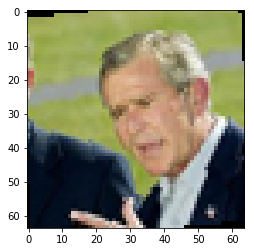

In [0]:
for (images, _) in gwb_train_loader2:
  plt.imshow(images[0].permute(1,2,0))
  break

Epoch: 0 Loss: 0.6924319639801979


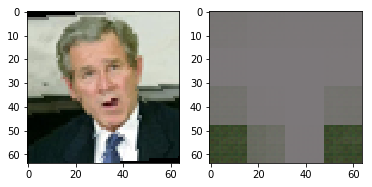

Epoch: 1 Loss: 0.47373266518116
Epoch: 2 Loss: 0.40582913532853127
Epoch: 3 Loss: 0.36869824305176735
Epoch: 4 Loss: 0.3412616588175297
Epoch: 5 Loss: 0.3128922451287508
Epoch: 6 Loss: 0.28826138749718666
Epoch: 7 Loss: 0.24348466470837593
Epoch: 8 Loss: 0.19622715935111046
Epoch: 9 Loss: 0.17168628238141537
Epoch: 10 Loss: 0.1574798058718443
Epoch: 11 Loss: 0.14560675248503685
Epoch: 12 Loss: 0.1361313946545124
Epoch: 13 Loss: 0.1276160879060626
Epoch: 14 Loss: 0.12279505748301744
Epoch: 15 Loss: 0.11685346253216267
Epoch: 16 Loss: 0.11118139419704676
Epoch: 17 Loss: 0.10425975546240807
Epoch: 18 Loss: 0.10340915434062481
Epoch: 19 Loss: 0.09676036983728409
Epoch: 20 Loss: 0.0925253750756383


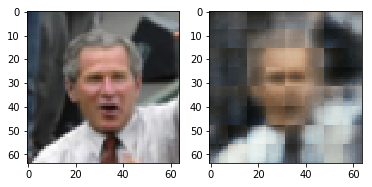

Epoch: 21 Loss: 0.08814945071935654
Epoch: 22 Loss: 0.08588150329887867
Epoch: 23 Loss: 0.08436602354049683
Epoch: 24 Loss: 0.0820329412817955
Epoch: 25 Loss: 0.08043335936963558
Epoch: 26 Loss: 0.07832688372582197
Epoch: 27 Loss: 0.0763385845348239
Epoch: 28 Loss: 0.07358810910955071
Epoch: 29 Loss: 0.072766053956002
Epoch: 30 Loss: 0.07107121404260397
Epoch: 31 Loss: 0.06726540625095367
Epoch: 32 Loss: 0.06766547169536352
Epoch: 33 Loss: 0.07095681177452207
Epoch: 34 Loss: 0.0676679965108633
Epoch: 35 Loss: 0.06538923224434257
Epoch: 36 Loss: 0.0651584193110466
Epoch: 37 Loss: 0.06315202824771404
Epoch: 38 Loss: 0.06105291796848178
Epoch: 39 Loss: 0.06000224547460675
Epoch: 40 Loss: 0.06156320683658123


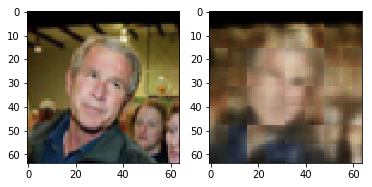

Epoch: 41 Loss: 0.06337367743253708
Epoch: 42 Loss: 0.06308035785332322
Epoch: 43 Loss: 0.06610433245077729
Epoch: 44 Loss: 0.06343165505677462
Epoch: 45 Loss: 0.06150058563798666
Epoch: 46 Loss: 0.05848144227638841
Epoch: 47 Loss: 0.05784736480563879
Epoch: 48 Loss: 0.05552841164171696
Epoch: 49 Loss: 0.058064550161361694
Epoch: 50 Loss: 0.058369590900838375
Epoch: 51 Loss: 0.057797687128186226
Epoch: 52 Loss: 0.055318275932222605
Epoch: 53 Loss: 0.05420973151922226
Epoch: 54 Loss: 0.05326839117333293
Epoch: 55 Loss: 0.05304633732885122
Epoch: 56 Loss: 0.0520724393427372
Epoch: 57 Loss: 0.05206761322915554
Epoch: 58 Loss: 0.05207418883219361
Epoch: 59 Loss: 0.05168162239715457
Epoch: 60 Loss: 0.051452068611979485


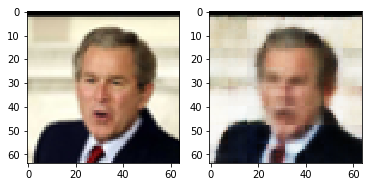

Epoch: 61 Loss: 0.051747214049100876
Epoch: 62 Loss: 0.05090229772031307
Epoch: 63 Loss: 0.049480931367725134
Epoch: 64 Loss: 0.04965475667268038
Epoch: 65 Loss: 0.049961922224611044
Epoch: 66 Loss: 0.04875431768596172
Epoch: 67 Loss: 0.048055652529001236
Epoch: 68 Loss: 0.048505494836717844
Epoch: 69 Loss: 0.04692071629688144
Epoch: 70 Loss: 0.04855493688955903
Epoch: 71 Loss: 0.0482117454521358
Epoch: 72 Loss: 0.04768033605068922
Epoch: 73 Loss: 0.04737583827227354
Epoch: 74 Loss: 0.04725983180105686
Epoch: 75 Loss: 0.04652944998815656
Epoch: 76 Loss: 0.04583340650424361
Epoch: 77 Loss: 0.04565015621483326
Epoch: 78 Loss: 0.04570539155974984
Epoch: 79 Loss: 0.0439646621234715
Epoch: 80 Loss: 0.04459978546947241


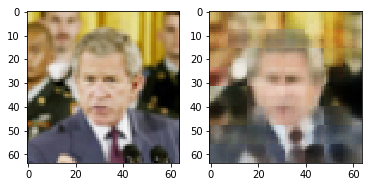

Epoch: 81 Loss: 0.044019542168825865
Epoch: 82 Loss: 0.045150328893214464
Epoch: 83 Loss: 0.049434008076786995
Epoch: 84 Loss: 0.05159092554822564
Epoch: 85 Loss: 0.04912536358460784
Epoch: 86 Loss: 0.04549048421904445
Epoch: 87 Loss: 0.045645921025425196
Epoch: 88 Loss: 0.044227033387869596
Epoch: 89 Loss: 0.04394556116312742
Epoch: 90 Loss: 0.042572446167469025
Epoch: 91 Loss: 0.043077926617115736
Epoch: 92 Loss: 0.04193538008257747
Epoch: 93 Loss: 0.04353596968576312
Epoch: 94 Loss: 0.042202743235975504
Epoch: 95 Loss: 0.042793966829776764
Epoch: 96 Loss: 0.042627380695194006
Epoch: 97 Loss: 0.041586406994611025
Epoch: 98 Loss: 0.04198613716289401
Epoch: 99 Loss: 0.04098026268184185
Epoch: 100 Loss: 0.04057469451799989


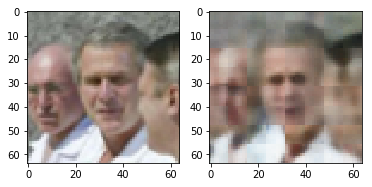

Epoch: 101 Loss: 0.0412011556327343
Epoch: 102 Loss: 0.0410884153097868
Epoch: 103 Loss: 0.04057644959539175
Epoch: 104 Loss: 0.040280476212501526
Epoch: 105 Loss: 0.040168896317481995
Epoch: 106 Loss: 0.03938623517751694
Epoch: 107 Loss: 0.040704863611608744
Epoch: 108 Loss: 0.04006153391674161
Epoch: 109 Loss: 0.042006516829133034
Epoch: 110 Loss: 0.040575452614575624
Epoch: 111 Loss: 0.04330687830224633
Epoch: 112 Loss: 0.046162683982402086
Epoch: 113 Loss: 0.04557966673746705
Epoch: 114 Loss: 0.04301922442391515
Epoch: 115 Loss: 0.041572993621230125
Epoch: 116 Loss: 0.040931294206529856
Epoch: 117 Loss: 0.03984212689101696
Epoch: 118 Loss: 0.04042799584567547
Epoch: 119 Loss: 0.03891723183915019
Epoch: 120 Loss: 0.03831031802110374


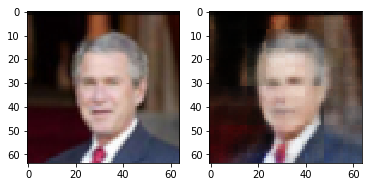

Epoch: 121 Loss: 0.038948407862335443
Epoch: 122 Loss: 0.03882981650531292
Epoch: 123 Loss: 0.039488268084824085
Epoch: 124 Loss: 0.03841637424193323
Epoch: 125 Loss: 0.039690203964710236
Epoch: 126 Loss: 0.0388227803632617
Epoch: 127 Loss: 0.038289482705295086
Epoch: 128 Loss: 0.03760547190904617
Epoch: 129 Loss: 0.03783583082258701
Epoch: 130 Loss: 0.03678735811263323
Epoch: 131 Loss: 0.03750124596990645
Epoch: 132 Loss: 0.036781904520466924
Epoch: 133 Loss: 0.03725001588463783
Epoch: 134 Loss: 0.03682143450714648
Epoch: 135 Loss: 0.03760794922709465
Epoch: 136 Loss: 0.03744483785703778
Epoch: 137 Loss: 0.03712723636999726
Epoch: 138 Loss: 0.03653313731774688
Epoch: 139 Loss: 0.03711108933202922
Epoch: 140 Loss: 0.03701487695798278


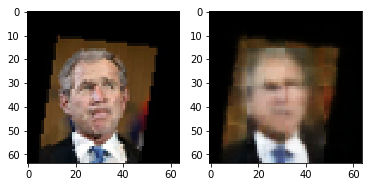

Epoch: 141 Loss: 0.03667754214257002
Epoch: 142 Loss: 0.037788406712934375
Epoch: 143 Loss: 0.03627897100523114
Epoch: 144 Loss: 0.03707573376595974
Epoch: 145 Loss: 0.03659970569424331
Epoch: 146 Loss: 0.0374049274250865
Epoch: 147 Loss: 0.036947591695934534
Epoch: 148 Loss: 0.03641137573868036
Epoch: 149 Loss: 0.03809447423554957
Epoch: 150 Loss: 0.03778108116239309
Epoch: 151 Loss: 0.03763637086376548
Epoch: 152 Loss: 0.03773155389353633
Epoch: 153 Loss: 0.03703043260611594
Epoch: 154 Loss: 0.0350328974891454
Epoch: 155 Loss: 0.037019875599071383
Epoch: 156 Loss: 0.03704222431406379
Epoch: 157 Loss: 0.03694606269709766
Epoch: 158 Loss: 0.03641705075278878
Epoch: 159 Loss: 0.036204098956659436
Epoch: 160 Loss: 0.03543633176013827


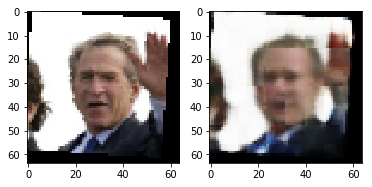

Epoch: 161 Loss: 0.03634493984282017
Epoch: 162 Loss: 0.036384148290380836
Epoch: 163 Loss: 0.03573183389380574
Epoch: 164 Loss: 0.037073904648423195
Epoch: 165 Loss: 0.0353437983430922
Epoch: 166 Loss: 0.03604461997747421
Epoch: 167 Loss: 0.035485067404806614
Epoch: 168 Loss: 0.035286910366266966
Epoch: 169 Loss: 0.03500016964972019
Epoch: 170 Loss: 0.035188645124435425
Epoch: 171 Loss: 0.035614413442090154
Epoch: 172 Loss: 0.03493209509178996
Epoch: 173 Loss: 0.03485122439451516
Epoch: 174 Loss: 0.03524611867032945
Epoch: 175 Loss: 0.03475881787016988
Epoch: 176 Loss: 0.03480427758768201
Epoch: 177 Loss: 0.03502422501333058
Epoch: 178 Loss: 0.03392664366401732
Epoch: 179 Loss: 0.03504045307636261
Epoch: 180 Loss: 0.03521623299457133


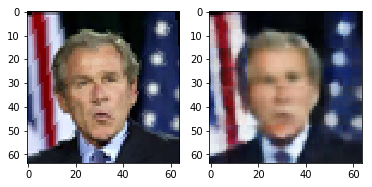

Epoch: 181 Loss: 0.03545188787393272
Epoch: 182 Loss: 0.03394781658425927
Epoch: 183 Loss: 0.034653698559850454
Epoch: 184 Loss: 0.03501894953660667
Epoch: 185 Loss: 0.034622209845110774
Epoch: 186 Loss: 0.035658984910696745
Epoch: 187 Loss: 0.03422422846779227
Epoch: 188 Loss: 0.03431314998306334
Epoch: 189 Loss: 0.035523749655112624
Epoch: 190 Loss: 0.03511212463490665
Epoch: 191 Loss: 0.03320010518655181
Epoch: 192 Loss: 0.03374790423549712
Epoch: 193 Loss: 0.03488173242658377
Epoch: 194 Loss: 0.034856277983635664
Epoch: 195 Loss: 0.03348563355393708
Epoch: 196 Loss: 0.03452835162170231
Epoch: 197 Loss: 0.03390224021859467
Epoch: 198 Loss: 0.03292592288926244
Epoch: 199 Loss: 0.034398864256218076


In [0]:
train(gwb_model, gwb_train_loader2, optimizer, print_metrics=0, num_epochs=200, display_images=20, scheduler=scheduler, save_path="./gwb_model.pt")